In [1]:
from data_loader import DataLoad_Train
from Model_FCRN import Model_FCRN
import torch
import matplotlib.pyplot as plt
import scipy.io as spio

In [2]:
# Here indicating the GPU you want to use. if you don't have GPU, just leave it.
cuda_available = torch.cuda.is_available()
device = torch.device('cuda:0')
torch.set_default_dtype(torch.float)

In [3]:
sample_length = 2
v_smooth_sigma = 5
data_norm = 0
r_seed = 123
results_path = '../results/'

In [4]:
train_seismic_data, train_data_v_smooth, train_label, test_seismic_data, v_smooth, test_label = DataLoad_Train(sample_length, 
                                                                                                               v_smooth_sigma, 
                                                                                                               data_norm, r_seed)

velocity.shape torch.Size([401, 401, 93])
seismic_data.shape torch.Size([401, 401, 93])
train_data.shape torch.Size([2, 93])
train_data_v_smooth.shape torch.Size([2, 93])
label_data.shape torch.Size([2, 93])
test_data.shape torch.Size([401, 401, 93])
test_label.shape torch.Size([401, 401, 93])


In [5]:
model_size = train_seismic_data.size()
model_val_size = test_seismic_data.size()

In [6]:
# train_data = torch.cat((train_seismic_data.view(model_size[0],1,model_size[1]), 
#                         train_data_v_smooth.view(model_size[0],1,model_size[1])), 1)
# train_data.shape

In [7]:
train_data = train_seismic_data.view(model_size[0],1,model_size[1])
train_data.shape

torch.Size([2, 1, 93])

In [8]:
# test_data = torch.cat((test_seismic_data.reshape(model_val_size[0]*model_val_size[1], 1, model_val_size[2]), 
#                        v_smooth.reshape(model_val_size[0]*model_val_size[1], 1, model_val_size[2])), 1)
# test_data.shape

In [9]:
test_data = test_seismic_data.reshape(model_val_size[0]*model_val_size[1], 1, model_val_size[2])
test_data.shape

torch.Size([160801, 1, 93])

In [10]:
torch.std_mean(train_data),torch.std_mean(test_data)

((tensor(1.1788), tensor(-0.0008)), (tensor(1.), tensor(-3.4059e-09)))

In [11]:
torch.min(train_data),torch.max(train_data),torch.min(test_data),torch.max(test_data)

(tensor(-3.3867), tensor(3.1503), tensor(-4.7978), tensor(4.5273))

In [12]:
in_channels = 1
out_channels = 1
is_batchnorm = False
net = Model_FCRN(in_channels, out_channels, is_batchnorm)
net.to(device)

Model_FCRN(
  (layer1): modelConv1(
    (conv1): Sequential(
      (0): Conv1d(1, 16, kernel_size=(31,), stride=(1,), padding=(15,))
      (1): ReLU(inplace=True)
    )
  )
  (group1): Sequential(
    (0): modelResBlock(
      (conv1): Sequential(
        (0): Conv1d(16, 16, kernel_size=(31,), stride=(1,), padding=(15,))
        (1): ReLU(inplace=True)
      )
      (conv2): Sequential(
        (0): Conv1d(16, 16, kernel_size=(3,), stride=(1,), padding=(1,))
      )
      (relu): ReLU(inplace=True)
    )
    (1): modelResBlock(
      (conv1): Sequential(
        (0): Conv1d(16, 16, kernel_size=(31,), stride=(1,), padding=(15,))
        (1): ReLU(inplace=True)
      )
      (conv2): Sequential(
        (0): Conv1d(16, 16, kernel_size=(3,), stride=(1,), padding=(1,))
      )
      (relu): ReLU(inplace=True)
    )
    (2): modelResBlock(
      (conv1): Sequential(
        (0): Conv1d(16, 16, kernel_size=(31,), stride=(1,), padding=(15,))
        (1): ReLU(inplace=True)
      )
      (conv

In [13]:
# Setup optimiser to perform inversion
optimizer = torch.optim.AdamW(net.parameters())
loss_fn_1 = torch.nn.L1Loss()
# loss_fn_2 = torch.nn.MSELoss()

0 4.3841729164123535
50 0.6932076215744019
100 0.1895057111978531
150 0.13417550921440125
200 0.11329073458909988
250 0.10765612870454788
300 0.11080804467201233
350 0.0921495109796524
400 0.07272827625274658
450 0.1035332903265953
500 0.1044430285692215
550 0.12433310598134995
600 0.06678828597068787
650 0.0646795779466629
700 0.046282507479190826
750 0.09453465044498444
800 0.08877035230398178
850 0.03640228882431984
900 0.07079464197158813
950 0.08128374069929123
1000 0.0488303080201149


/tmp/ipykernel_97025/296554563.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


1050 0.03866403177380562
1100 0.09878754615783691
1150 0.09067175537347794
1200 0.07866189628839493
1250 0.0963045060634613
1300 0.11897236853837967
1350 0.15336522459983826
1400 0.07362605631351471
1450 0.060135502368211746
1500 0.04610833898186684
1550 0.018813179805874825
1600 0.042981166392564774
1650 0.015089771710336208
1700 0.026675095781683922
1750 0.03563058748841286
1800 0.027446966618299484
1850 0.03234655782580376
1900 0.05489792302250862
1950 0.03533869981765747
2000 0.0399705246090889
2050 0.027175774797797203
2100 0.03774551674723625
2150 0.09854281693696976
2200 0.0333174429833889
2250 0.01916748285293579
2300 0.04184716194868088
2350 0.04491925984621048
2400 0.023860817775130272
2450 0.06325585395097733
2500 0.019713226705789566
2550 0.04009922221302986
2600 0.026506910100579262
2650 0.02634798362851143
2700 0.1462768316268921
2750 0.11037548631429672
2800 0.016948072239756584
2850 0.04363148286938667
2900 0.043581292033195496
2950 0.021153884008526802
3000 0.018841963

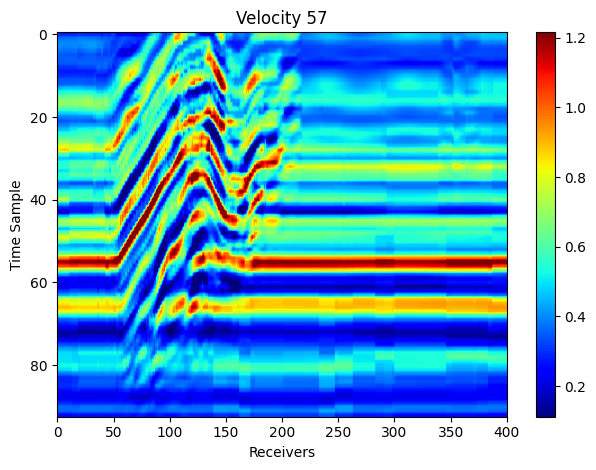

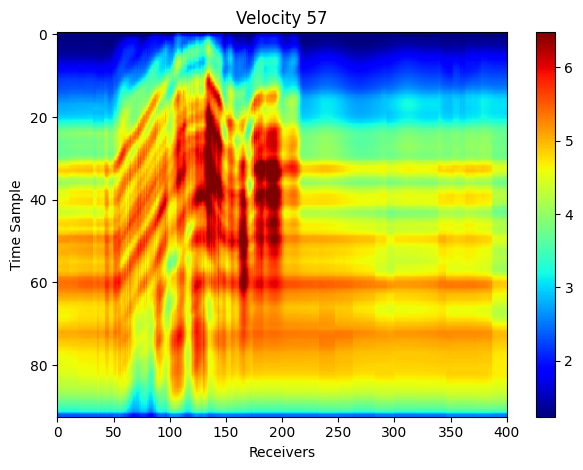

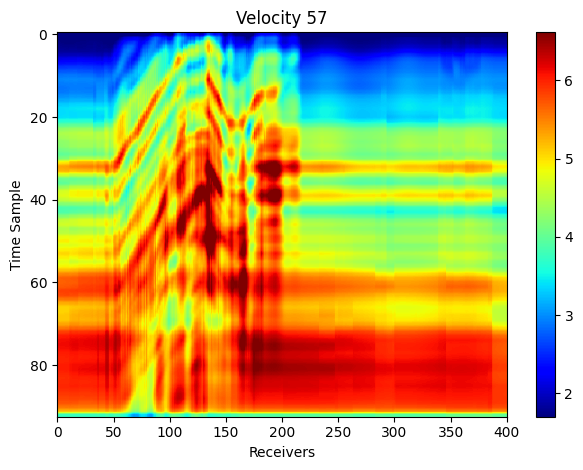

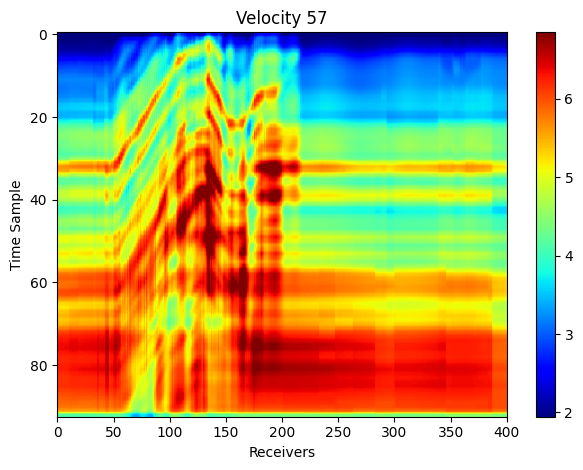

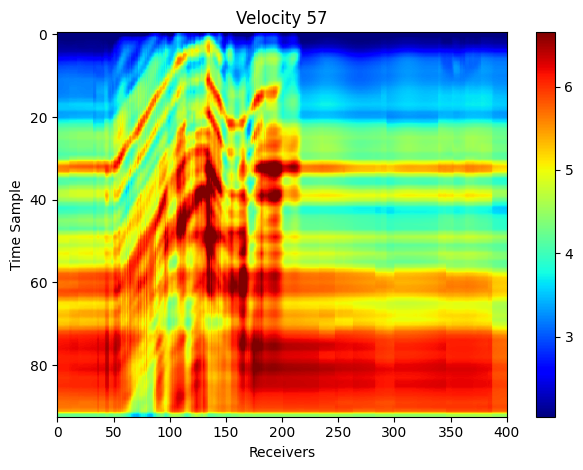

...

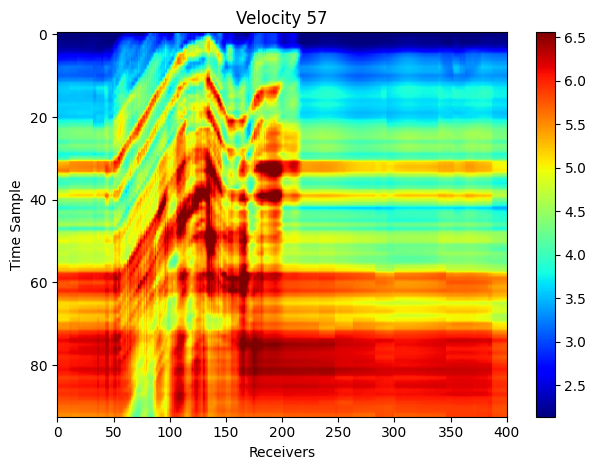

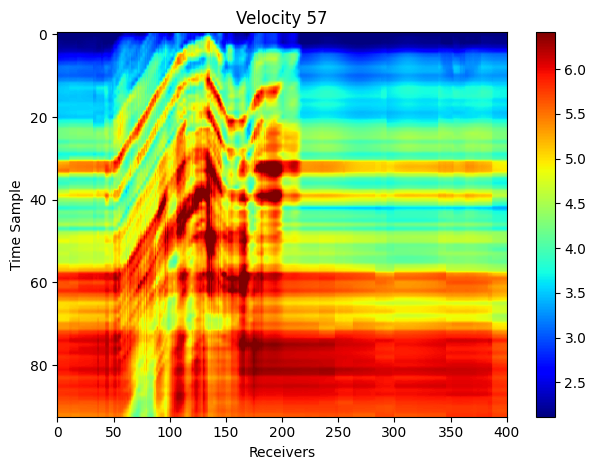

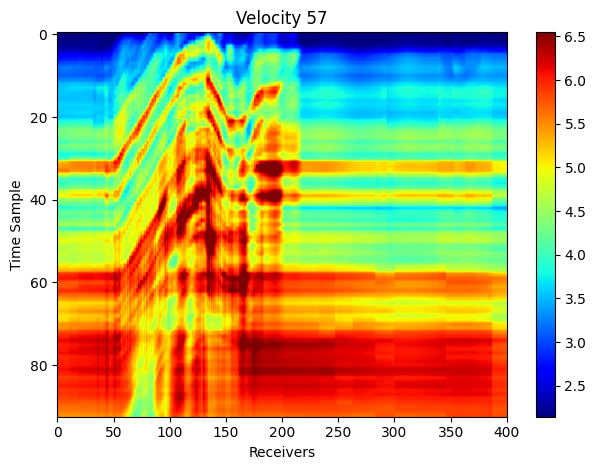

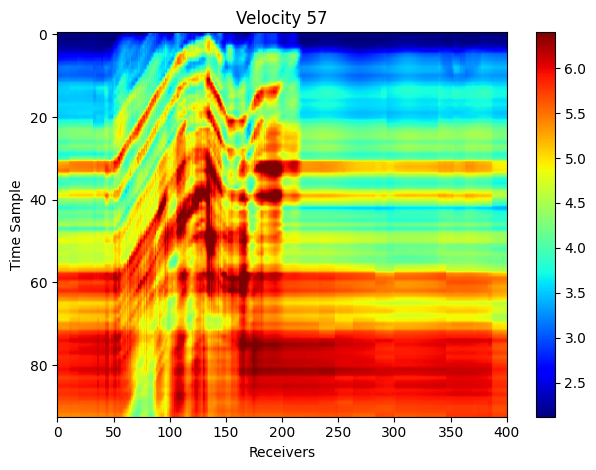

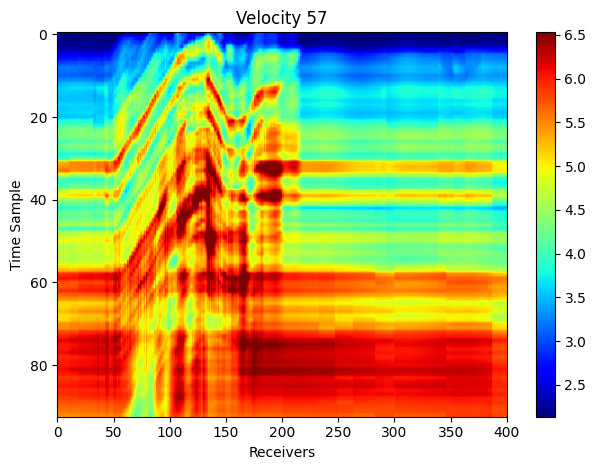

In [14]:
num_epochs = 5000
for epoch in range(num_epochs):
    
    optimizer.zero_grad()
    
    outputs = net(train_data.to(device))
    
#     loss = (
#             loss_fn_1(outputs,
#                     (train_label.view(model_size[0], 1, model_size[1]).to(device))) + 
#             loss_fn_2(outputs,
#                     (train_label.view(model_size[0], 1, model_size[1]).to(device)))
        
#         )
    loss = (
            loss_fn_1(outputs,
                    (train_label.view(model_size[0], 1, model_size[1]).to(device)))
        )
    loss.backward()
    
    optimizer.step()
    
    if epoch % 50 == 0:
        with torch.no_grad():
            print(epoch,loss.item())
            net.eval()
            
            outputs_val = net(test_data.to(device))
            outputs_val = outputs_val.reshape(model_val_size[0], model_val_size[1], model_val_size[2])
            vmin, vmax = torch.quantile(outputs_val[0,:,:].cpu(), torch.tensor([0.01, 0.99]))
            
            plt.figure()
            plt.imshow(outputs_val[0,:,:].T.cpu(), aspect='auto', cmap='jet', vmax=vmax, vmin=vmin)
            plt.xlabel("Receivers")
            plt.ylabel("Time Sample")
            plt.title("Velocity 57")
            plt.colorbar()

            plt.tight_layout()
            plt.savefig(results_path + str(epoch) + '_pre_velocity_sm.jpg')

In [ ]:
# with torch.no_grad():
#     net.eval()

#     outputs_val = net(test_data.to(device))
#     outputs_val = outputs_val.reshape(model_val_size[0], model_val_size[1], model_val_size[2])
# #     vmin, vmax = torch.quantile(outputs_val[0,:,:].cpu(),
# #                     torch.tensor([0.01, 0.99]))
# #     plt.imshow(outputs_val[0,:,:].T.cpu(), aspect='auto',
# #                  cmap='jet')
# #     plt.xlabel("Receivers")
# #     plt.ylabel("Time Sample")
# #     plt.title("Velocity 57")
# #     plt.colorbar()

# #     plt.tight_layout()
# #     plt.savefig(results_path+'pre_velocity.jpg')
    
#     spio.savemat(results_path + 'pre_velocity_sm.mat',{'pre_velocity':outputs_val.cpu().data.numpy()})